In [615]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [616]:
data_path_math = '/content/drive/MyDrive/student-mat.csv'
data_path_por = '/content/drive/MyDrive/student-por.csv'

In [617]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import scipy.stats as st
from sklearn.feature_selection import SelectPercentile, f_classif, chi2, SelectKBest, SelectFpr
from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.metrics import confusion_matrix, accuracy_score, precision_recall_fscore_support,plot_confusion_matrix, classification_report
from sklearn.model_selection import train_test_split, RandomizedSearchCV
import xgboost as xgb
!pip install sweetviz
import sweetviz as sv


In [618]:
df_math = pd.read_csv(data_path_math, sep=";")
df_math

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5,6
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8,10
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14,15
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MS,M,20,U,LE3,A,2,2,services,services,course,other,1,2,2,no,yes,yes,no,yes,yes,no,no,5,5,4,4,5,4,11,9,9,9
391,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,3,14,16,16
392,MS,M,21,R,GT3,T,1,1,other,other,course,other,1,1,3,no,no,no,no,no,yes,no,no,5,5,3,3,3,3,3,10,8,7
393,MS,M,18,R,LE3,T,3,2,services,other,course,mother,3,1,0,no,no,no,no,no,yes,yes,no,4,4,1,3,4,5,0,11,12,10


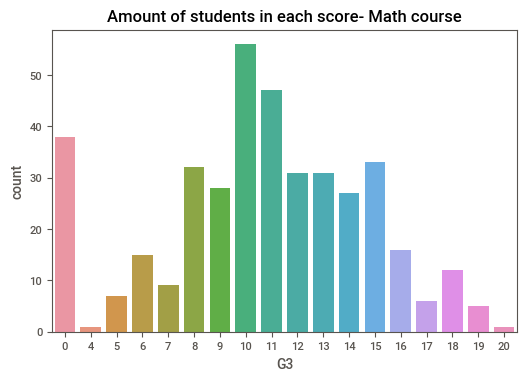

In [619]:
sns.countplot(x = df_math.G3)
plt.title("Amount of students in each score- Math course")
plt.show()

In [620]:
df_por = pd.read_csv(data_path_por, sep=";")
df_por

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,fatherd,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,G3
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,4,0,11,11
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,2,9,11,11
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,0,yes,no,no,no,yes,yes,yes,no,4,3,2,2,3,3,6,12,13,12
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,no,yes,yes,yes,yes,yes,3,2,2,1,1,5,0,14,14,14
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,no,no,yes,yes,no,no,4,3,2,1,2,5,0,11,13,13
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
644,MS,F,19,R,GT3,T,2,3,services,other,course,mother,1,3,1,no,no,no,yes,no,yes,yes,no,5,4,2,1,2,5,4,10,11,10
645,MS,F,18,U,LE3,T,3,1,teacher,services,course,mother,1,2,0,no,yes,no,no,yes,yes,yes,no,4,3,4,1,1,1,4,15,15,16
646,MS,F,18,U,GT3,T,1,1,other,other,course,mother,2,2,0,no,no,no,yes,yes,yes,no,no,1,1,1,1,1,5,6,11,12,9
647,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,6,10,10,10


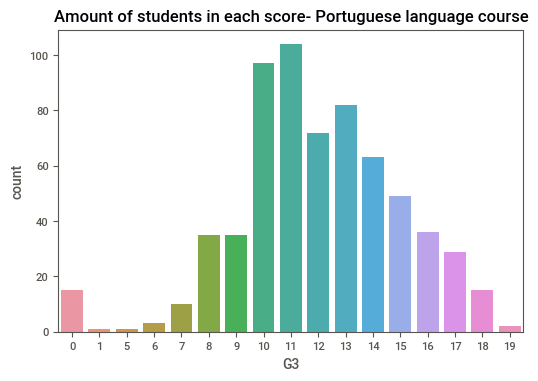

In [621]:
sns.countplot(x = df_por.G3)
plt.title("Amount of students in each score- Portuguese language course")
plt.show()

#Data Understanding

                                             |          | [  0%]   00:00 -> (? left)


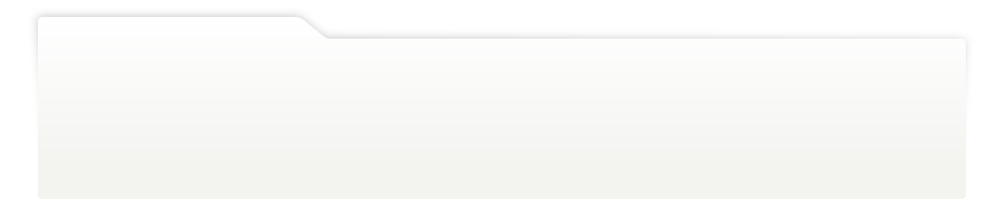
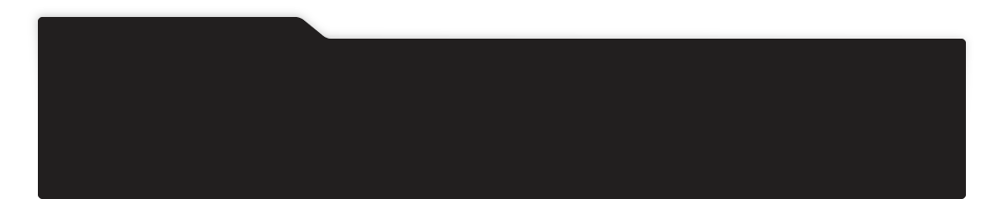
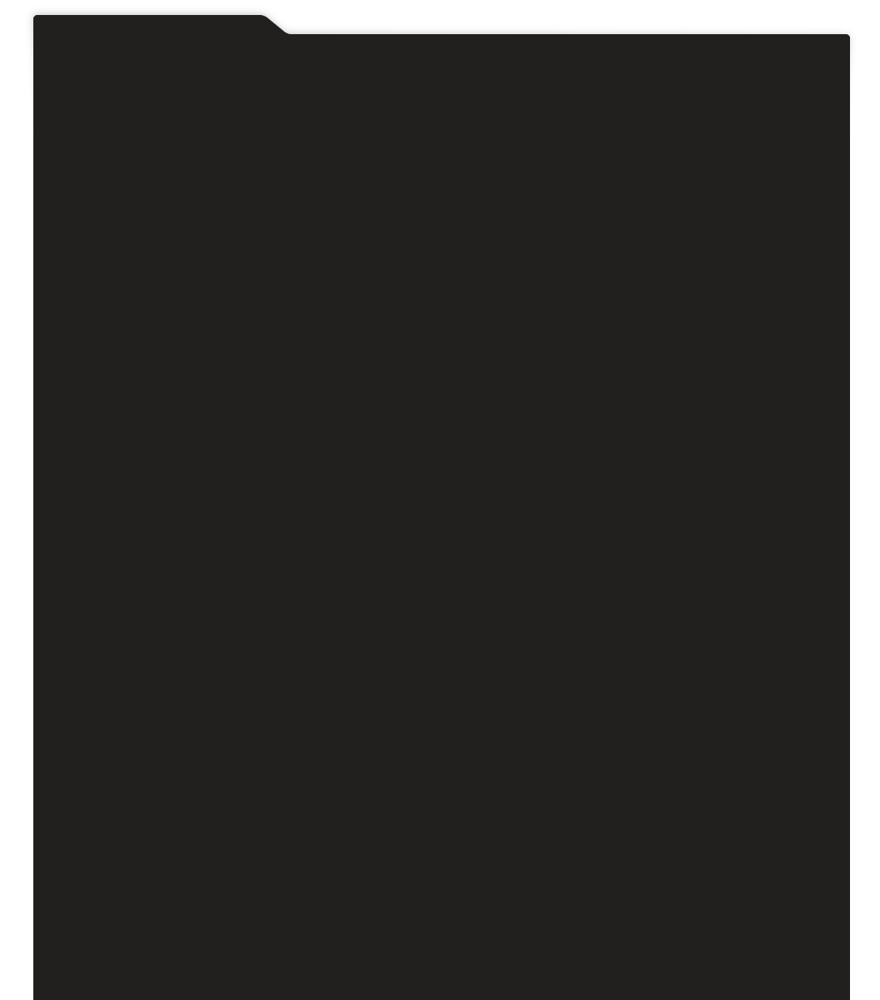
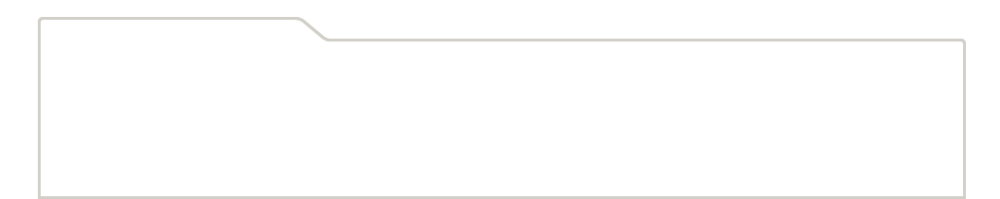
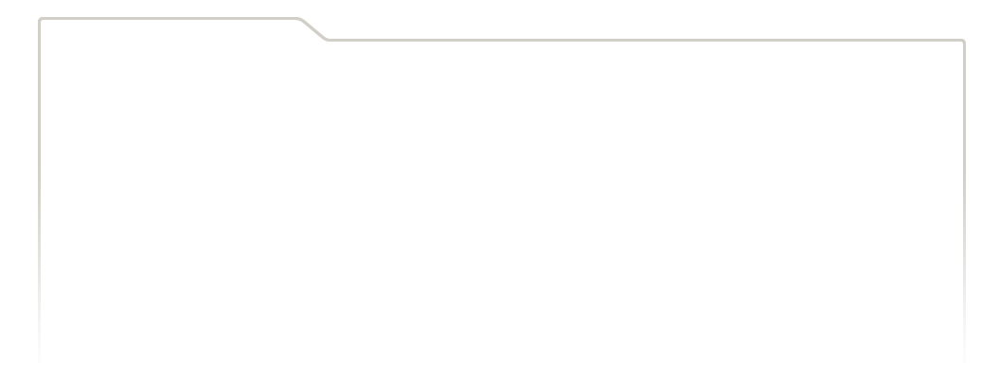
...
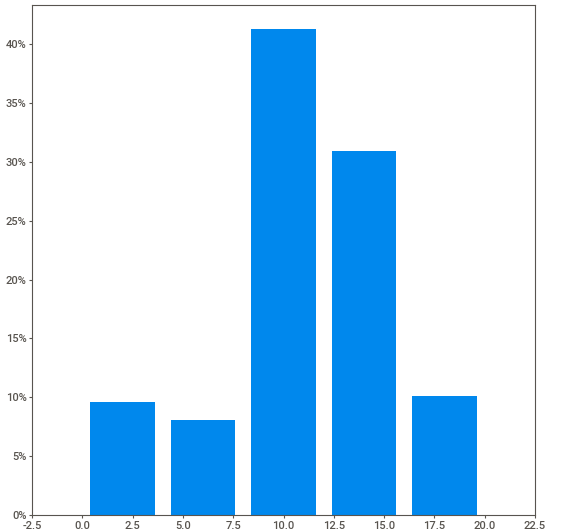
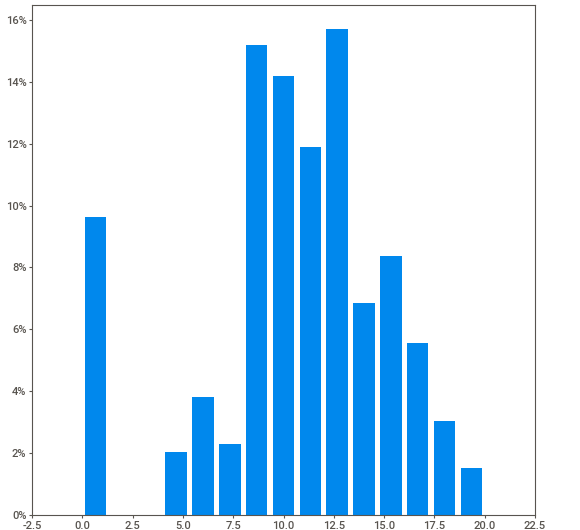
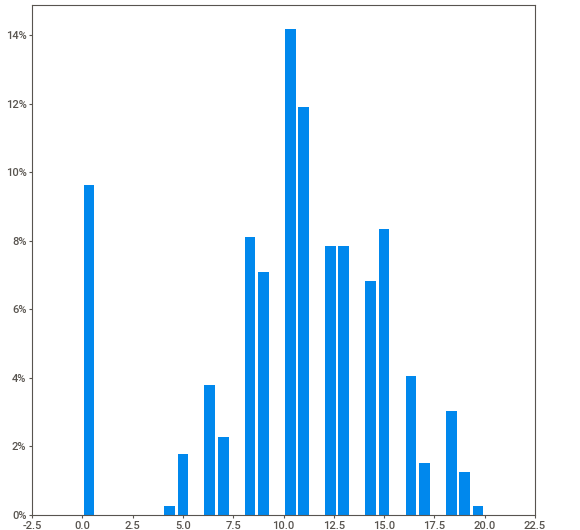
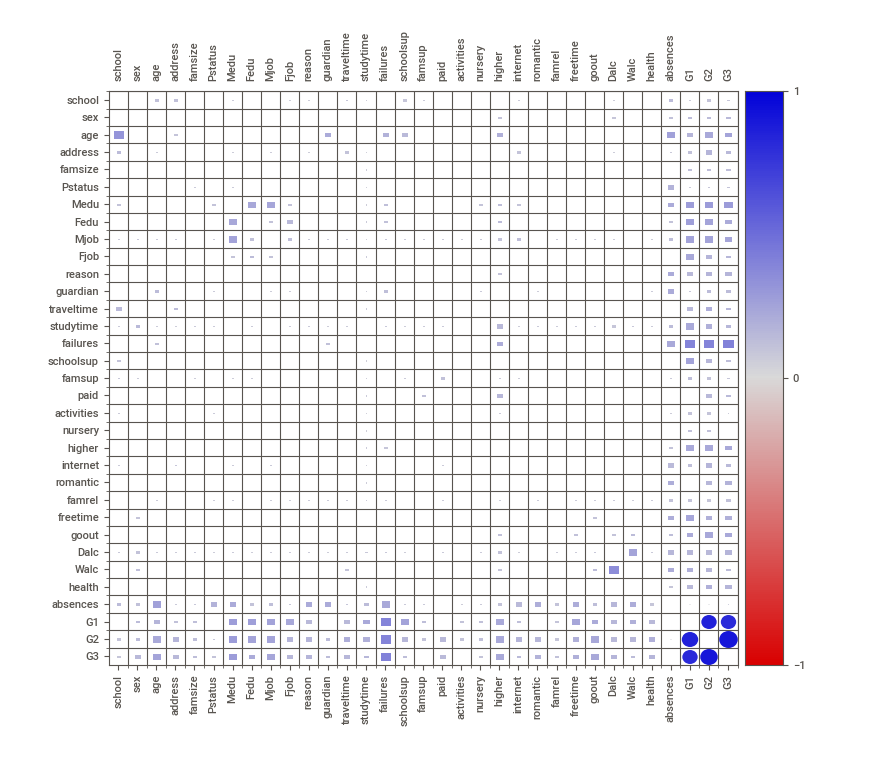
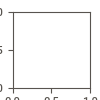

In [622]:
# Source:
# https://towardsdatascience.com/sweetviz-automated-eda-in-python-a97e4cabacde
# https://pypi.org/project/sweetviz/
math_report = sv.analyze(df_math)
math_report.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)


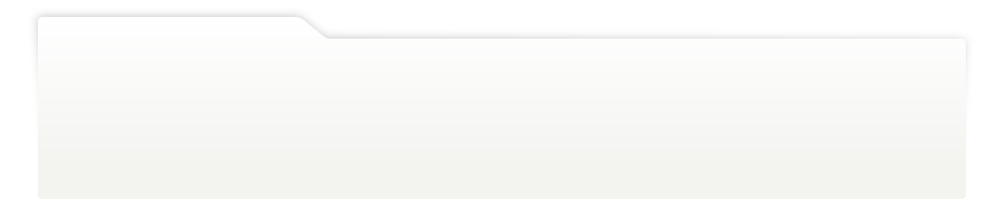
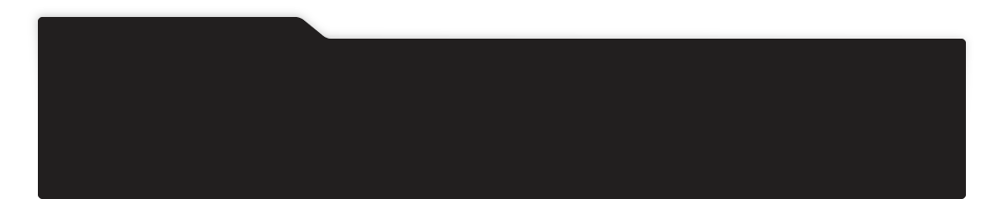
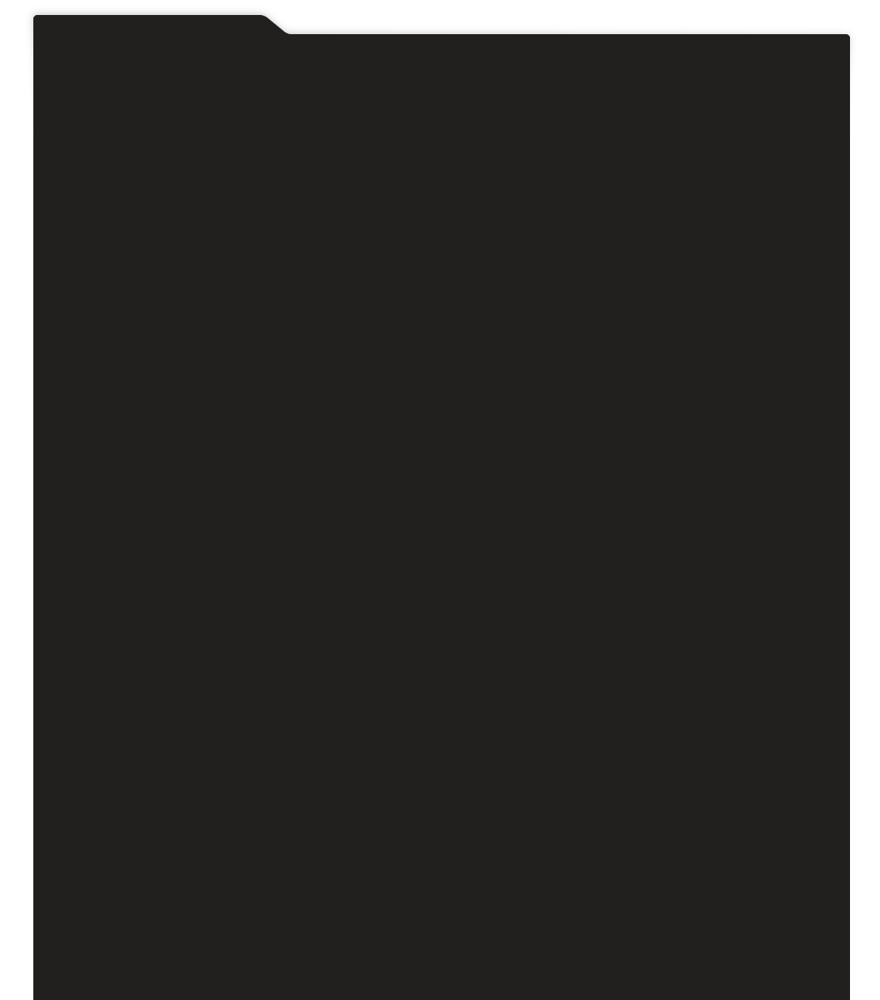
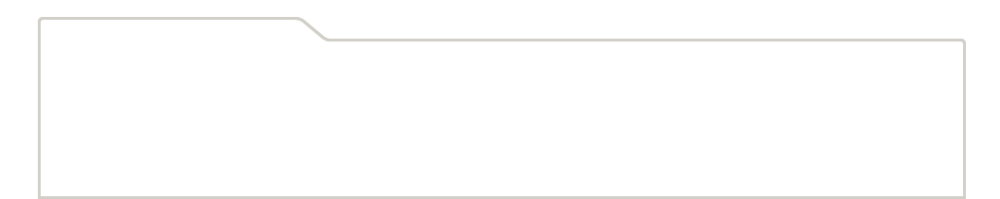
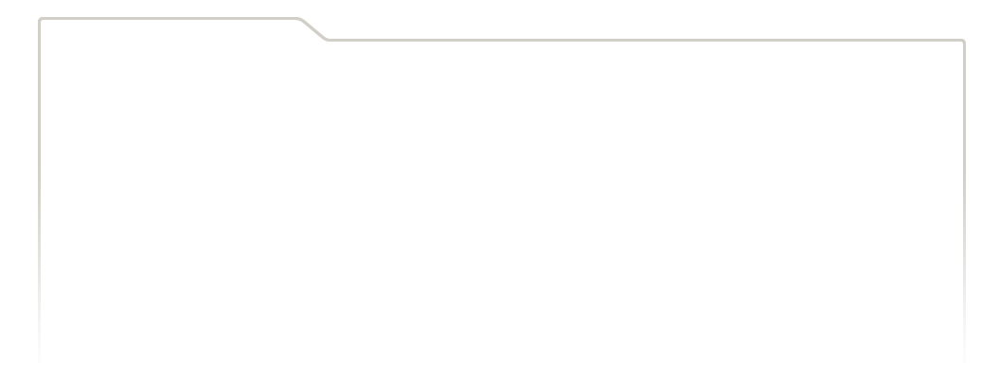
...
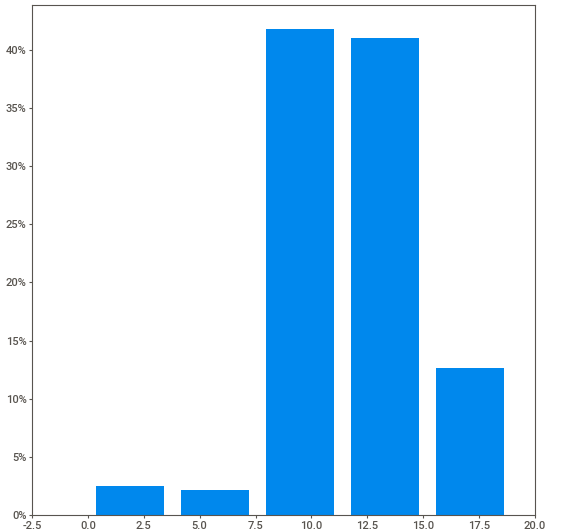
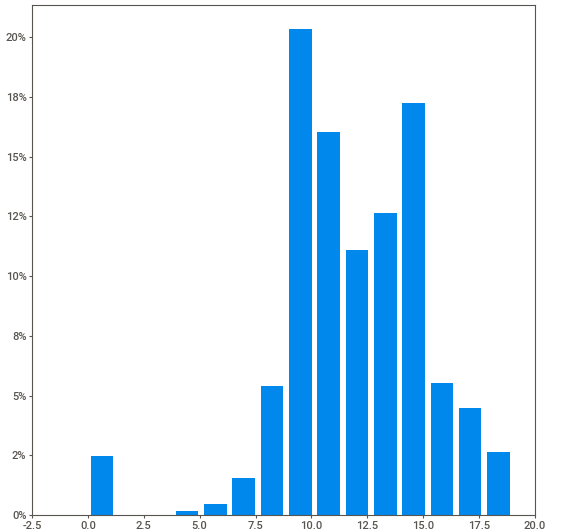
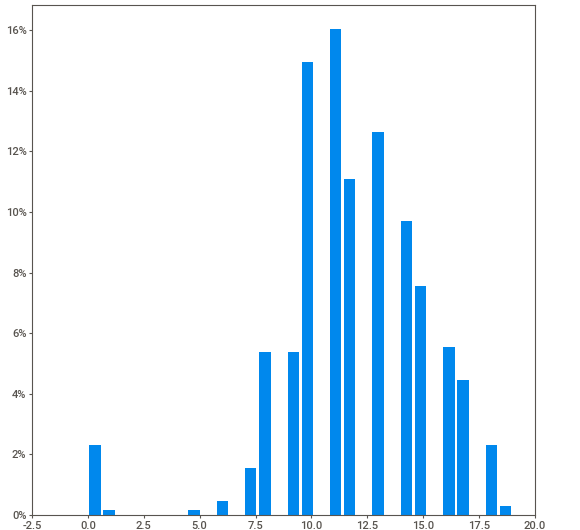
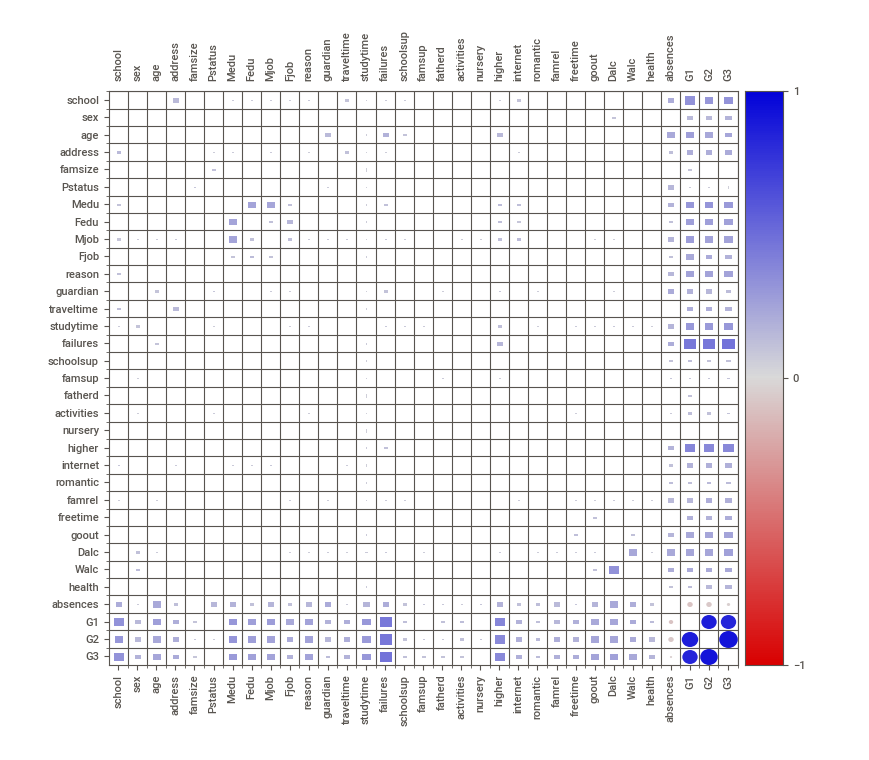
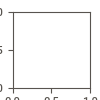

In [623]:
por_report = sv.analyze(df_por)
por_report.show_notebook()

# Data Preparation

In [624]:
df_math_copy = df_math.copy()
df_por_copy = df_por.copy()

Remove target

In [625]:
df_math = df_math.iloc[:,:-1]
df_por = df_por.iloc[:,:-1]

Create dummies

In [626]:
df_new_math = pd.get_dummies(df_math)
df_new_math.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,school_GP,school_MS,sex_F,sex_M,address_R,address_U,famsize_GT3,famsize_LE3,Pstatus_A,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_no,schoolsup_yes,famsup_no,famsup_yes,paid_no,paid_yes,activities_no,activities_yes,nursery_no,nursery_yes,higher_no,higher_yes,internet_no,internet_yes,romantic_no,romantic_yes
0,18,4,4,2,2,0,4,3,4,1,1,3,6,5,6,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,1,1,0,1,0
1,17,1,1,1,2,0,5,3,3,1,1,3,4,5,5,1,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,1,1,0
2,15,1,1,1,2,3,4,3,2,2,3,3,10,7,8,1,0,1,0,0,1,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,0,1,1,0,0,1,0,1,0,1,1,0
3,15,4,2,1,3,0,3,2,2,1,1,5,2,15,14,1,0,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,0,1,0,1,0,1,0,1,0,1,0,1
4,16,3,3,1,2,0,4,3,2,1,2,5,4,6,10,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,0,1,1,0,0,1,0,1,1,0,1,0


In [627]:
df_new_por = pd.get_dummies(df_por)
df_new_por.head()

,age,Medu,Fedu,traveltime,studytime,failures,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2,school_GP,school_MS,sex_F,sex_M,address_R,address_U,famsize_GT3,famsize_LE3,Pstatus_A,Pstatus_T,Mjob_at_home,Mjob_health,Mjob_other,Mjob_services,Mjob_teacher,Fjob_at_home,Fjob_health,Fjob_other,Fjob_services,Fjob_teacher,reason_course,reason_home,reason_other,reason_reputation,guardian_father,guardian_mother,guardian_other,schoolsup_no,schoolsup_yes,famsup_no,famsup_yes,fatherd_no,fatherd_yes,activities_no,activities_yes,nursery_no,nursery_yes,higher_no,higher_yes,internet_no,internet_yes,romantic_no,romantic_yes
0,18,4,4,2,2,0,4,3,4,1,1,3,4,0,11,1,0,1,0,0,1,1,0,1,0,1,0,0,0,0,0,0,0,0,1,1,0,0,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,1,1,0,1,0
1,17,1,1,1,2,0,5,3,3,1,1,3,2,9,11,1,0,1,0,0,1,1,0,0,1,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,1,1,0
2,15,1,1,1,2,0,4,3,2,2,3,3,6,12,13,1,0,1,0,0,1,0,1,0,1,1,0,0,0,0,0,0,1,0,0,0,0,1,0,0,1,0,0,1,1,0,1,0,1,0,0,1,0,1,0,1,1,0
3,15,4,2,1,3,0,3,2,2,1,1,5,0,14,14,1,0,1,0,0,1,1,0,0,1,0,1,0,0,0,0,0,0,1,0,0,1,0,0,0,1,0,1,0,0,1,1,0,0,1,0,1,0,1,0,1,0,1
4,16,3,3,1,2,0,4,3,2,1,2,5,0,11,13,1,0,1,0,0,1,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,1,0,0,1,0,0,1,0,0,1,1,0,1,0,0,1,0,1,1,0,1,0


# Modeling + Evaluation

In [628]:
# source
# https://stackoverflow.com/questions/43927725/python-hyperparameter-optimization-for-xgbclassifier-using-randomizedsearchcv
clf_xgb = xgb.XGBRegressor(objective = 'reg:squarederror')
param_dist = {'n_estimators': st.randint(150, 1000),
              'learning_rate': st.uniform(0.01, 0.6),
              'subsample': [0.4,0.5,0.6,0.7,0.8,0.9,1],
              'max_depth': [3, 4, 5, 6, 7, 8, 9],
              'colsample_bytree': [0.5,0.6,0.7,0.8,0.9,1],
              'min_child_weight': [1, 2, 3, 4]
             }                     

In [629]:
y_math = df_math_copy["G3"]
y_por = df_por_copy["G3"]
x_math = df_new_math
x_por = df_new_por
X_train_math, X_test_math, y_train_math, y_test_math = train_test_split(x_math, y_math, test_size=0.2, random_state = 42)
X_train_por, X_test_por, y_train_por, y_test_por = train_test_split(x_por, y_por, test_size=0.2, random_state = 42)

Check the data:

                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de


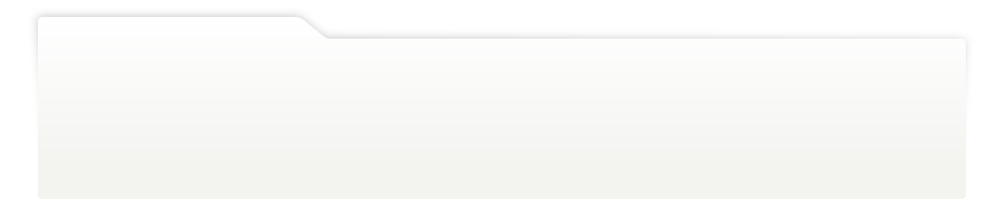
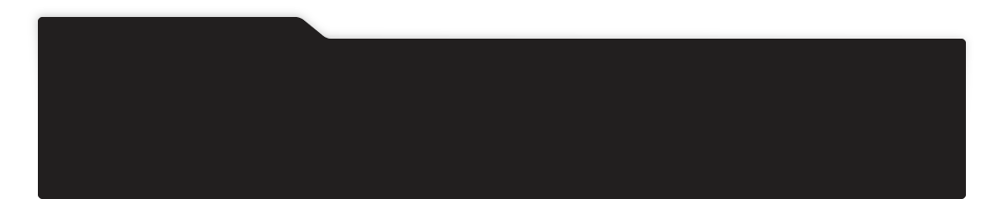
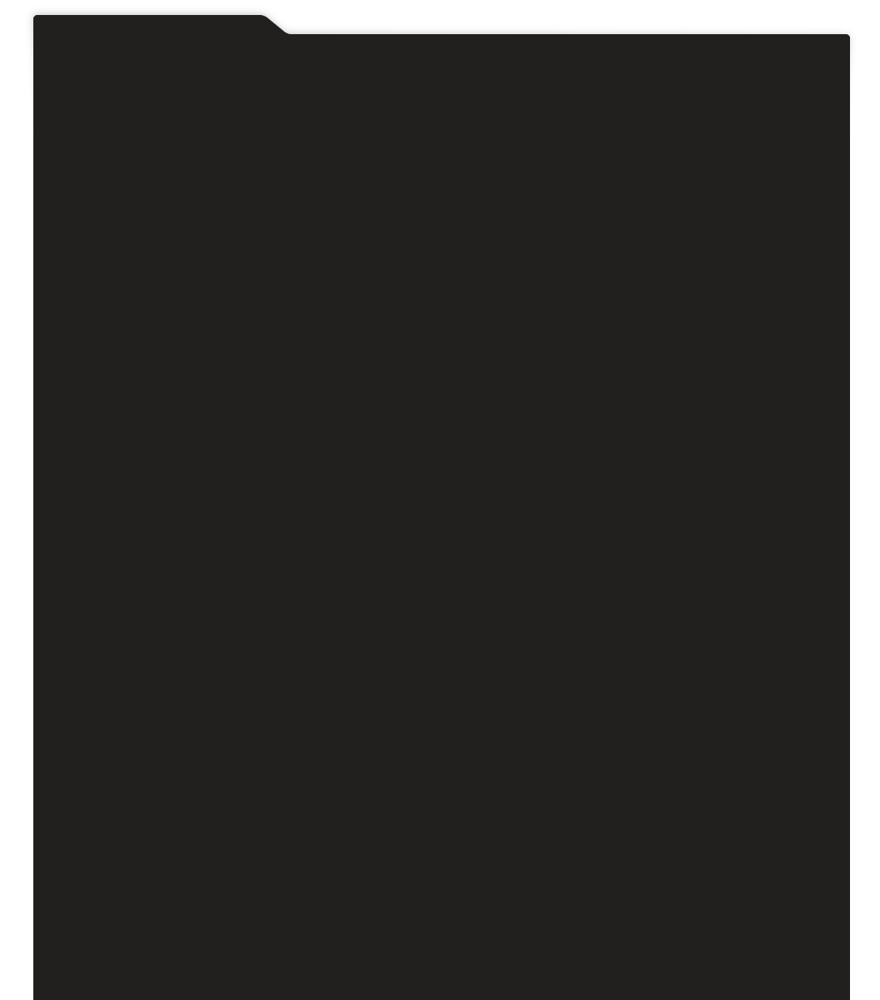
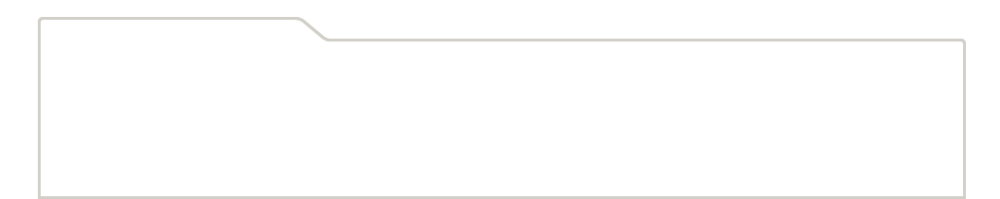
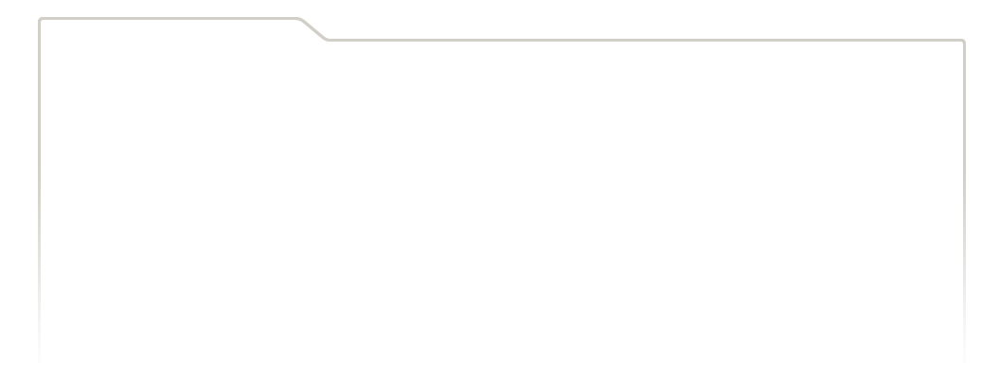
...
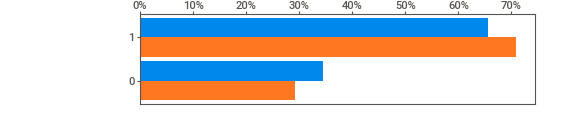
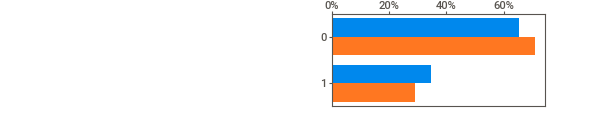
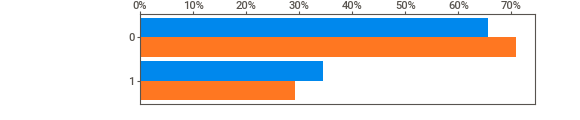
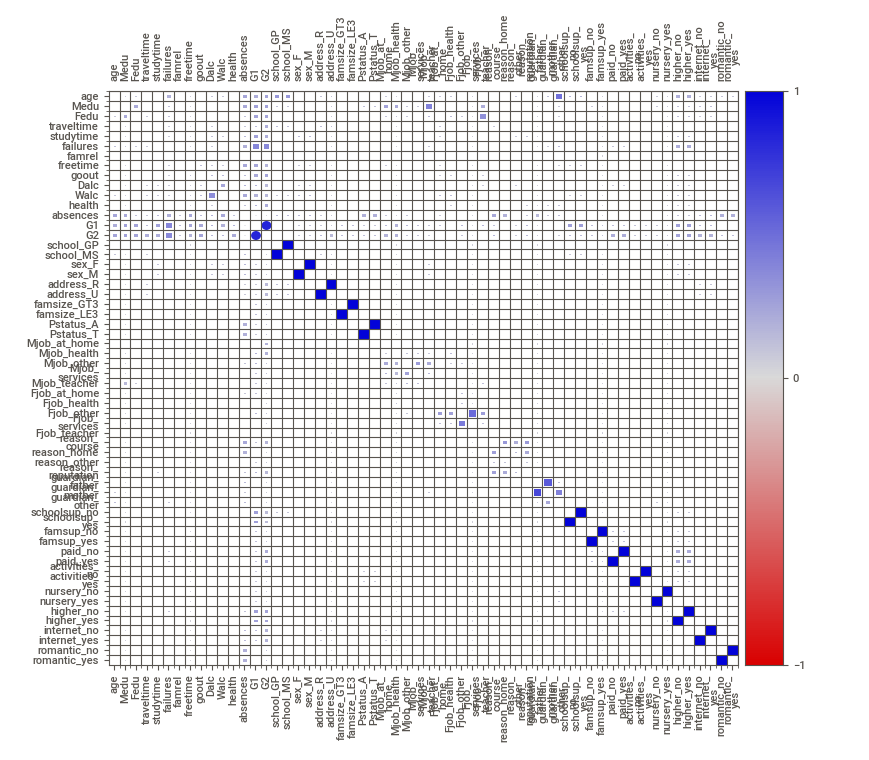
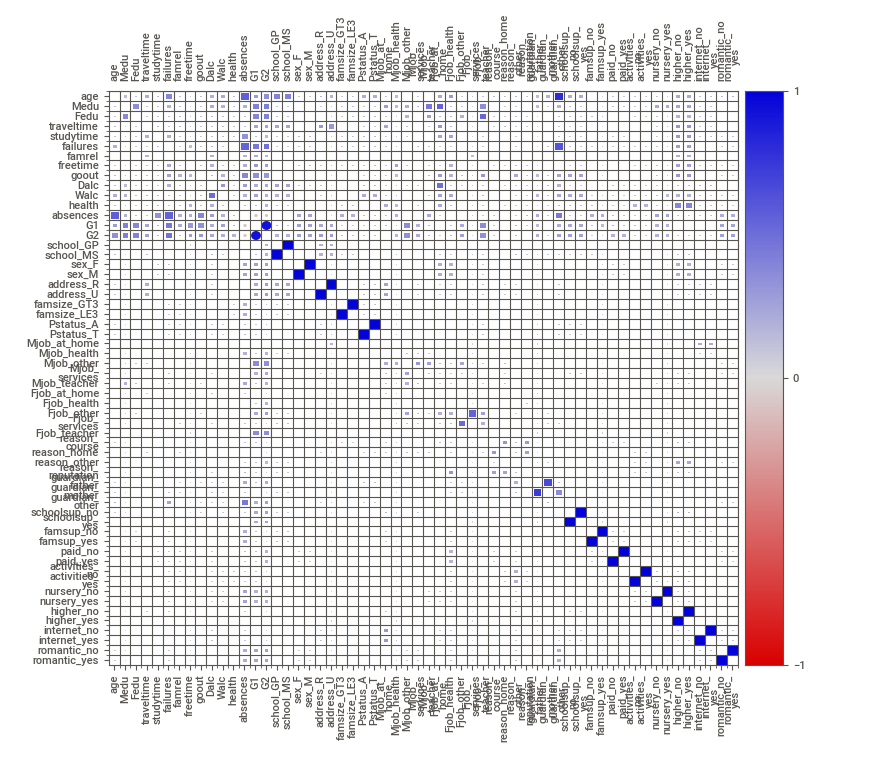

In [630]:
compare_report_math = sv.compare(X_train_math,X_test_math)
compare_report_math.show_notebook()

                                             |          | [  0%]   00:00 -> (? left)

/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)
/usr/local/lib/python3.6/dist-packages/numpy/core/_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is de


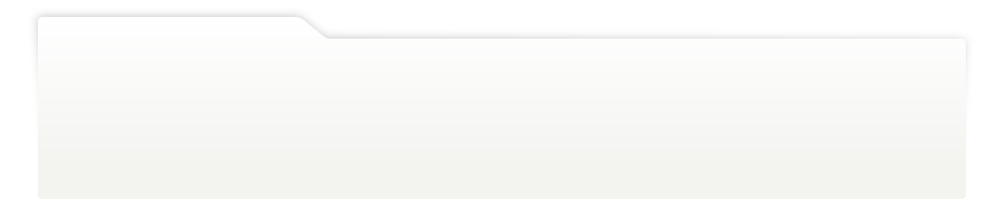
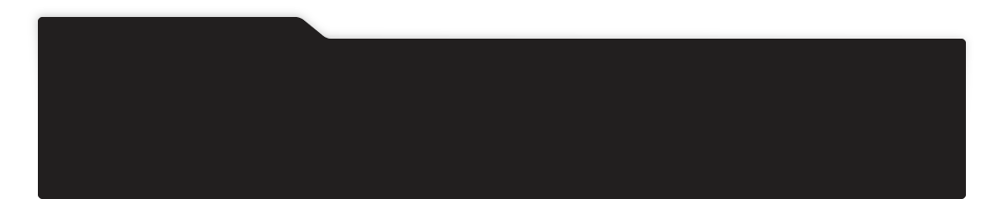
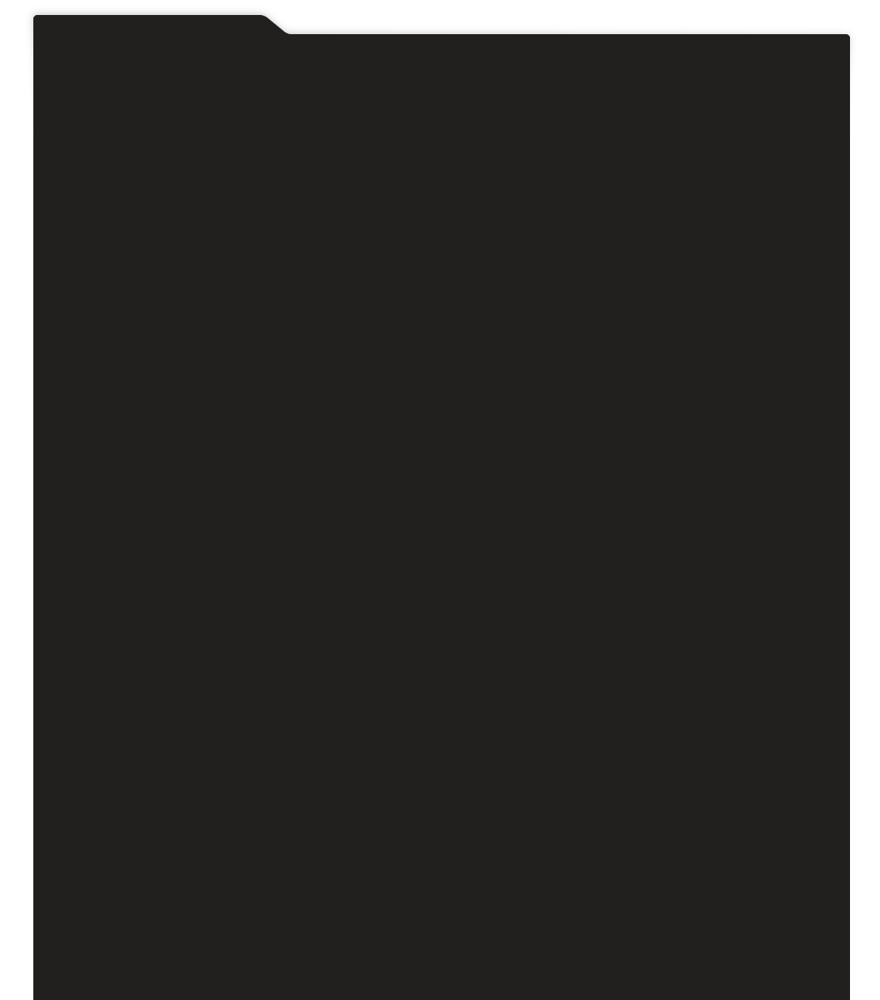
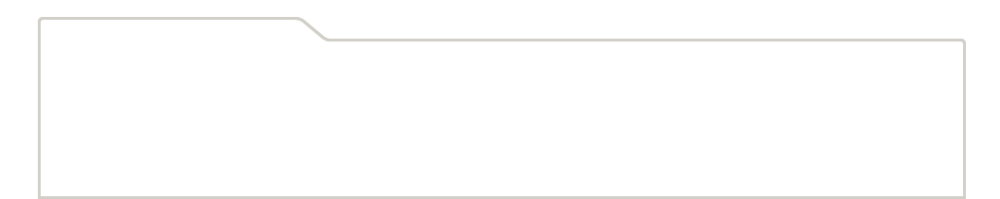
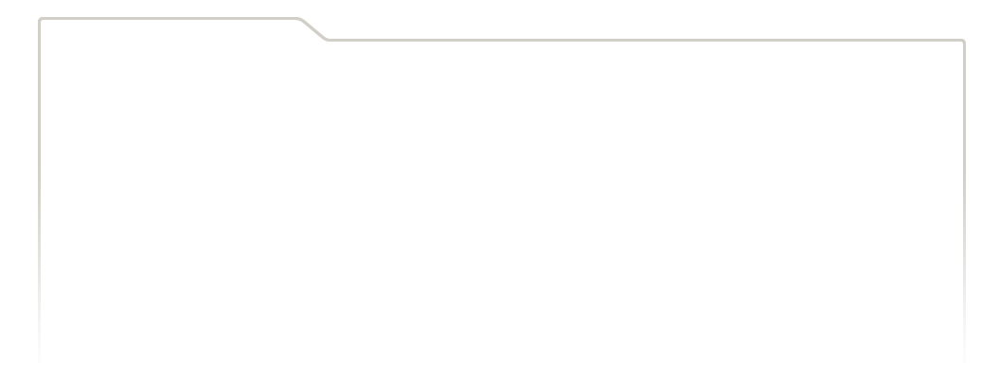
...
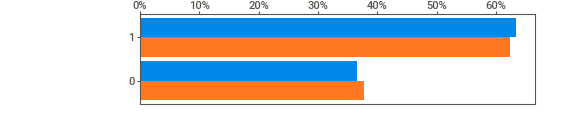
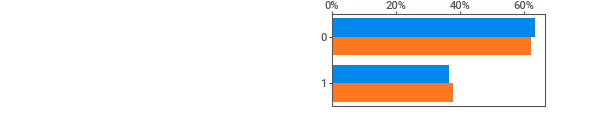
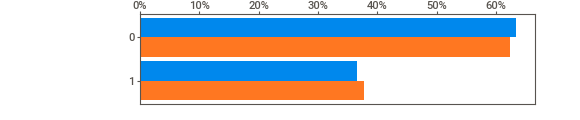
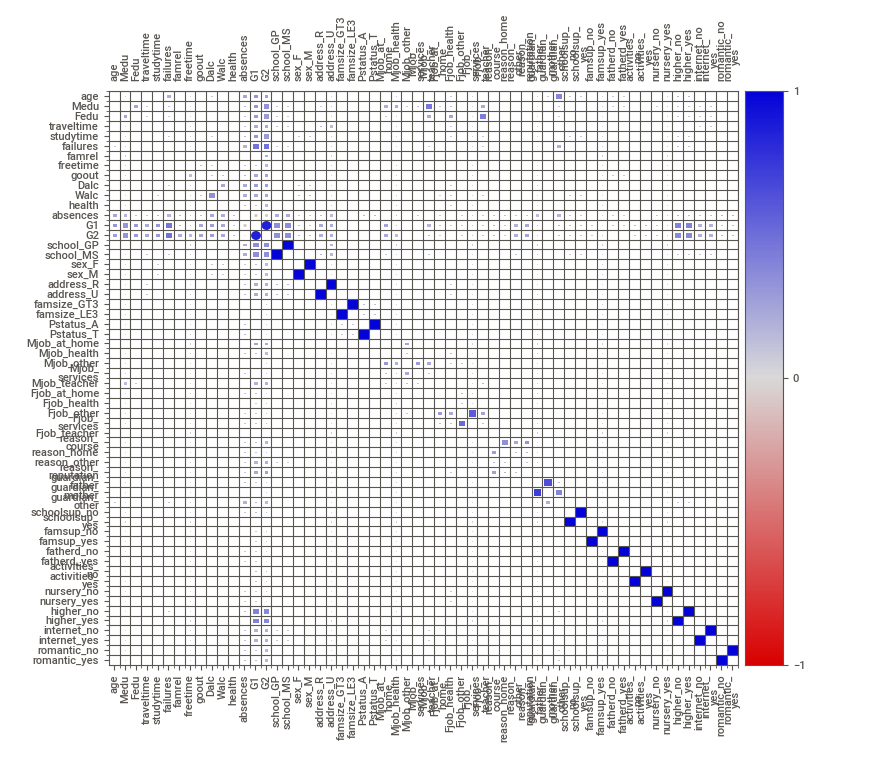
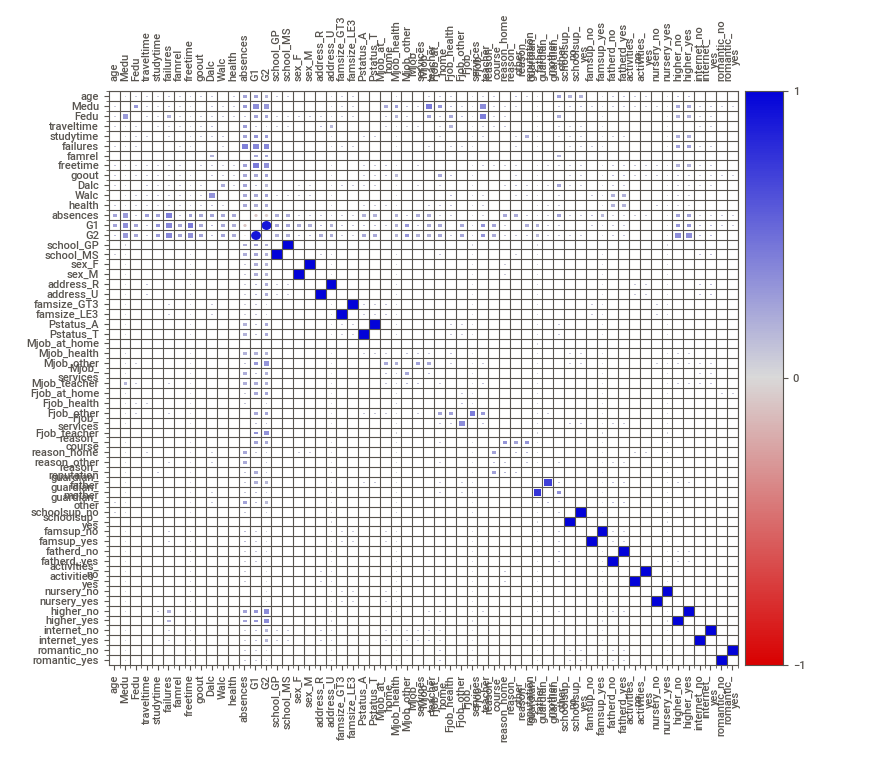

In [631]:
compare_report_por = sv.compare(X_train_por,X_test_por)
compare_report_por.show_notebook()

Math:

In [632]:
# source
# https://stackoverflow.com/questions/43927725/python-hyperparameter-optimization-for-xgbclassifier-using-randomizedsearchcv
clf_math = RandomizedSearchCV(clf_xgb, 
                         param_distributions = param_dist,
                         cv = 10,  
                         n_iter = 5, 
                         scoring = 'r2', 
                         error_score = 0, 
                         verbose = 3, 
                         n_jobs = -1)   

In [658]:
clf_math.fit(X_train_math,y_train_math)
math_predict = clf_math.predict(X_test_math)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    5.6s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   10.9s finished


Train score

In [634]:
clf_math.best_score_

0.9130969007891434

Test score

In [635]:
clf_math.score(X_test_math,y_test_math)

0.8019453695285392

Portuguese language:

In [636]:
clf_por = RandomizedSearchCV(clf_xgb, 
                         param_distributions = param_dist,
                         cv = 10,  
                         n_iter = 5, 
                         scoring = 'r2', 
                         error_score = 0, 
                         verbose = 3, 
                         n_jobs = -1)  

In [655]:
clf_por.fit(X_train_por,y_train_por)
por_predict = clf_por.predict(X_test_por)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:   10.2s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   20.2s finished


Train score

In [656]:
clf_por.best_score_

0.8108999263196243

Test score

In [657]:
clf_por.score(X_test_por,y_test_por)

0.8251140748588928

#Binary option:

In [640]:
# pass = 1, fail = 0
def convert_grade_to_binary(grade):
  if(grade >= 10):
    grade = 1
  else:
    grade = 0
  return grade

df_math_copy["G3"] = df_math_copy["G3"].apply(lambda x: convert_grade_to_binary(x))
df_por_copy["G3"] = df_por_copy["G3"].apply(lambda x: convert_grade_to_binary(x))
df_math

,school,sex,age,address,famsize,Pstatus,Medu,Fedu,Mjob,Fjob,reason,guardian,traveltime,studytime,failures,schoolsup,famsup,paid,activities,nursery,higher,internet,romantic,famrel,freetime,goout,Dalc,Walc,health,absences,G1,G2
0,GP,F,18,U,GT3,A,4,4,at_home,teacher,course,mother,2,2,0,yes,no,no,no,yes,yes,no,no,4,3,4,1,1,3,6,5,6
1,GP,F,17,U,GT3,T,1,1,at_home,other,course,father,1,2,0,no,yes,no,no,no,yes,yes,no,5,3,3,1,1,3,4,5,5
2,GP,F,15,U,LE3,T,1,1,at_home,other,other,mother,1,2,3,yes,no,yes,no,yes,yes,yes,no,4,3,2,2,3,3,10,7,8
3,GP,F,15,U,GT3,T,4,2,health,services,home,mother,1,3,0,no,yes,yes,yes,yes,yes,yes,yes,3,2,2,1,1,5,2,15,14
4,GP,F,16,U,GT3,T,3,3,other,other,home,father,1,2,0,no,yes,yes,no,yes,yes,no,no,4,3,2,1,2,5,4,6,10
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
390,MS,M,20,U,LE3,A,2,2,services,services,course,other,1,2,2,no,yes,yes,no,yes,yes,no,no,5,5,4,4,5,4,11,9,9
391,MS,M,17,U,LE3,T,3,1,services,services,course,mother,2,1,0,no,no,no,no,no,yes,yes,no,2,4,5,3,4,2,3,14,16
392,MS,M,21,R,GT3,T,1,1,other,other,course,other,1,1,3,no,no,no,no,no,yes,no,no,5,5,3,3,3,3,3,10,8
393,MS,M,18,R,LE3,T,3,2,services,other,course,mother,3,1,0,no,no,no,no,no,yes,yes,no,4,4,1,3,4,5,0,11,12


In [641]:
y_math_bin = df_math_copy["G3"]
y_por_bin = df_por_copy["G3"]
x_math_bin = df_new_math
x_por_bin = df_new_por
X_train_math_bin, X_test_math_bin, y_train_math_bin, y_test_math_bin = train_test_split(x_math_bin, y_math_bin, test_size=0.2)
X_train_por_bin, X_test_por_bin, y_train_por_bin, y_test_por_bin = train_test_split(x_por_bin, y_por_bin, test_size=0.2)

In [642]:
clf_xgb_class = xgb.XGBClassifier(objective = 'binary:logistic')
param_dist = {'n_estimators': st.randint(150, 1000),
              'learning_rate': st.uniform(0.01, 0.6),
              'subsample': [0.4,0.5,0.6,0.7,0.8,0.9,1],
              'max_depth': [3, 4, 5, 6, 7, 8, 9],
              'colsample_bytree': [0.5,0.6,0.7,0.8,0.9,1],
              'min_child_weight': [1, 2, 3, 4]
             }      

Math

In [643]:
clf_binary_math = RandomizedSearchCV(clf_xgb_class, 
                         param_distributions = param_dist,
                         cv = 10,  
                         n_iter = 5, 
                         scoring = 'roc_auc', 
                         error_score = 0, 
                         verbose = 3, 
                         n_jobs = -1) 

In [644]:
clf_binary_math.fit(X_train_math_bin,y_train_math_bin)
math_bin_pred = clf_binary_math.predict(X_test_math_bin)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  47 out of  50 | elapsed:    7.4s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:    7.8s finished


Train score:

In [645]:
clf_binary_math.best_score_

0.9675757575757575

Test score:

In [646]:
clf_binary_math.score(X_test_math_bin,y_test_math_bin)

0.9696296296296297

In [647]:
print("Math-Binary accurscy:")
print(classification_report(y_test_math_bin, math_bin_pred, labels=[0, 1]))

Math-Binary accurscy:
              precision    recall  f1-score   support

           0       0.82      0.92      0.87        25
           1       0.96      0.91      0.93        54

    accuracy                           0.91        79
   macro avg       0.89      0.91      0.90        79
weighted avg       0.92      0.91      0.91        79



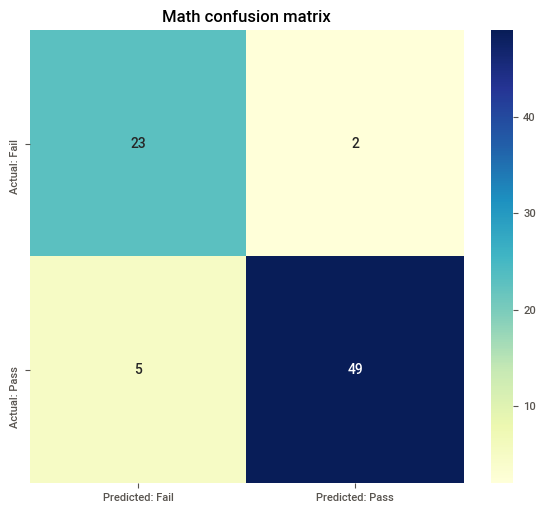

In [648]:
plt.figure(figsize=[7, 6])
plt.title("Math confusion matrix")
cm = confusion_matrix(y_test_math_bin,math_bin_pred)
sns.heatmap(cm, annot=cm, fmt='g', xticklabels=['Predicted: Fail','Predicted: Pass'], yticklabels=['Actual: Fail','Actual: Pass'], cmap='YlGnBu')

Portuguese language

In [649]:
clf_binary_por = RandomizedSearchCV(clf_xgb_class, 
                         param_distributions = param_dist,
                         cv = 10,  
                         n_iter = 5, 
                         scoring = 'roc_auc', 
                         error_score = 0, 
                         verbose = 3, 
                         n_jobs = -1) 

In [650]:
clf_binary_por.fit(X_train_por_bin,y_train_por_bin)
por_bin_pred = clf_binary_por.predict(X_test_por_bin)

Fitting 10 folds for each of 5 candidates, totalling 50 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  28 tasks      | elapsed:    7.9s
[Parallel(n_jobs=-1)]: Done  50 out of  50 | elapsed:   14.1s finished


Train score

In [651]:
clf_binary_por.best_score_

0.95571158008658

Test score

In [652]:
clf_binary_por.score(X_test_por_bin,y_test_por_bin)

0.9496139780577001

In [653]:
print("Portuguese language-Binary accurscy:")
print(classification_report(y_test_por_bin, por_bin_pred, labels=[0, 1]))

Portuguese language-Binary accurscy:
              precision    recall  f1-score   support

           0       0.82      0.61      0.70        23
           1       0.92      0.97      0.95       107

    accuracy                           0.91       130
   macro avg       0.87      0.79      0.82       130
weighted avg       0.90      0.91      0.90       130



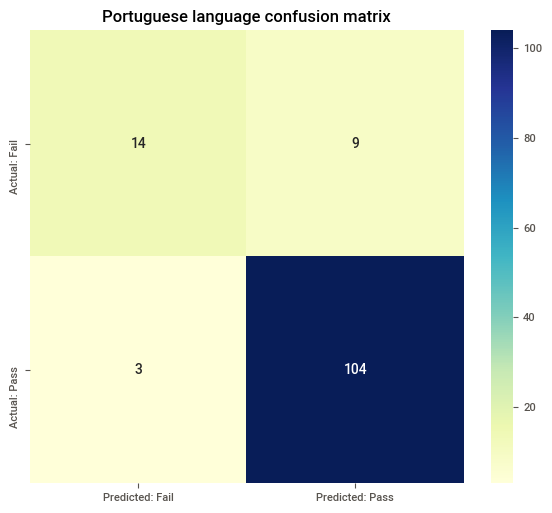

In [654]:
plt.figure(figsize=[7, 6])
plt.title("Portuguese language confusion matrix")
cm = confusion_matrix(y_test_por_bin,por_bin_pred)
sns.heatmap(cm, annot=cm, fmt='g', xticklabels=['Predicted: Fail','Predicted: Pass'], yticklabels=['Actual: Fail','Actual: Pass'], cmap='YlGnBu')